### Semi-autonomous Teleoperation Demo : Place task in `Kitchen Plate` scene with `small size dish rack`

### Parse `Realistic Scene`

In [7]:
import mujoco #,cv2,pyvista
import numpy as np
import matplotlib.pyplot as plt
import sys
sys.path.append('../../../')
from utils.mujoco_parser import MuJoCoParserClass

from utils.util import sample_xyzs,rpy2r,r2rpy,r2quat,compute_view_params,get_interp_const_vel_traj, printmd
np.set_printoptions(precision=2,suppress=True,linewidth=100)
plt.rc('xtick',labelsize=6); plt.rc('ytick',labelsize=6)
%config InlineBackend.figure_format = 'retina'
%matplotlib inline
print ("MuJoCo version:[%s]"%(mujoco.__version__))

MuJoCo version:[2.3.3]


In [8]:
xml_path = '../../../asset/scene_kitchen_dish_rack_white.xml'
env = MuJoCoParserClass(name='Place task scene: Plate table',rel_xml_path=xml_path,VERBOSE=False, MODE='window')
print(env.MODE)

# Move tables and robot base
env.model.body('base_table').pos = np.array([0,0,0])
env.model.body('base').pos = np.array([0.18,0,0.79])
env.model.body('avoiding_object_table').pos = np.array([0.38+0.45,0,0])
env.model.body('right_object_table').pos = np.array([-0.05,-0.80,0])
env.model.body('left_object_table').pos = np.array([-1.5,0.80,0])

# Place objects
obj_box_names = [body_name for body_name in env.body_names
             if body_name is not None and (body_name.startswith("obj_box"))]
n_box_obj = len(obj_box_names)
env.place_objects_random(n_obj=n_box_obj, obj_names=obj_box_names, x_range=[0.80, 1.15], y_range=[-3.15, -2.15], COLORS=False, VERBOSE=True)

jntadr_mug_cup = env.model.body('mug_cup').jntadr[0]
env.model.joint(jntadr_mug_cup).qpos0[:3] = np.array([ 0.9, -0.3, 0.85])
env.model.joint(jntadr_mug_cup).qpos0[3:] = r2quat(rpy2r(np.radians([0, 0, np.random.rand() * 360])))

jntadr_tray = env.model.body('tray').jntadr[0]
env.model.joint(jntadr_tray).qpos0[:3] = np.array([0.9,-0.3,0.80])
# env.model.joint(jntadr_tray).qpos0[3:] = r2quat(rpy2r(np.radians([0, 0, 0])))

jntadr_dish_rack = env.model.body('dish_rack').jntadr[0]
pos_dish_rack = np.array([0.9,0.35,0.82])
env.model.joint(jntadr_dish_rack).qpos0[:3] = pos_dish_rack
dish_rack_random_rot = 0 # np.random.rand() * 360
env.model.joint(jntadr_dish_rack).qpos0[3:] = r2quat(rpy2r(np.radians([0, 0, dish_rack_random_rot])))


# Target dish
env.model.joint(env.model.body('kitchen-plate').jntadr[0]).qpos0[:3] = np.array([0.2, -0.7, 0.8])
# Set the dishes
env.model.joint(env.model.body('kitchen-plate-2').jntadr[0]).qpos0[:3] = np.array([0.92, 0.39, 0.95])
env.model.joint(env.model.body('kitchen-plate-2').jntadr[0]).qpos0[3:] = r2quat(rpy2r(np.radians([0, 90, 360])))
env.model.joint(env.model.body('kitchen-plate-3').jntadr[0]).qpos0[:3] = np.array([[0.86, 0.39, 0.95]])
env.model.joint(env.model.body('kitchen-plate-3').jntadr[0]).qpos0[3:] = r2quat(rpy2r(np.radians([0, 90, 360])))
env.model.joint(env.model.body('kitchen-plate-4').jntadr[0]).qpos0[:3] = np.array([[0.81, 0.39, 0.95]])
env.model.joint(env.model.body('kitchen-plate-4').jntadr[0]).qpos0[3:] = r2quat(rpy2r(np.radians([0, 90, 360])))
# env.model.joint(env.model.body('kitchen-plate-2').jntadr[0]).qpos0[:3] = pos_dish_rack + np.array([0.0,0.02, 0.2])
# env.model.joint(env.model.body('kitchen-plate-3').jntadr[0]).qpos0[:3] = pos_dish_rack + np.array([-0.05, 0.02, 0.2])
# env.model.joint(env.model.body('kitchen-plate-4').jntadr[0]).qpos0[:3] = pos_dish_rack + np.array([-0.1, 0.02, 0.2])

env.reset()

window


In [9]:
import openai 
import os 
import random 
random.seed(42)
import time 
s = time.time()
def gauss_2d(mu, sigma=0.01):
    x = random.gauss(mu[0], sigma)
    y = random.gauss(mu[1], sigma)
    return (x, y)

openai.api_key = 'your key' 
models = openai.Model.list()
# for model in models['data']:
#     print(model['id'])
print("Done.")

engine = "text-davinci-003"
prompt = '''
The goal is to place a plate in the kitchen. 
In terms of the symbolic spatial relationship between objects, 
a plate is suitable for placement on a dish rack. 
The rack has slots aligned along the y-axis

The center of mass of dish rack is placed on {x:0.9, y:0.35, z:0.82}m.
The dish rack size is {x:0.11, y:0.2, z:0.22}m.
The center of mass of Plate2 is placed in a rack where the coordinate is {x: 0.92, y: 0.39, z: 0.82}m.
The center of mass of Plate3 is placed in a rack where the coordinate is {x: 0.86, y: 0.39, z: 0.82}m.
The center of mass of Plate4 is placed in a rack where the coordinate is {x: 0.81, y: 0.39, z: 0.82}m.
The plate size is {x:0.14, y:0.02, z:0.14}m.

How many centimeters a plate should other plates be placed from the center of mass of dish rack?
'''

response = openai.Completion.create(engine='text-davinci-003',
                                   prompt=prompt,
                                   max_tokens = 512,
                                   temperature =1.0)
print("Answer: ", response["choices"][0]['text'])

for i in range(20):
    res = gauss_2d([0.92, 0.35],0.05)

print(time.time()-s)

Done.
Answer:  
The distance between the center of mass of each plate and the center of mass of the dish rack should be approximately 2 cm.


1. Result: (0.9164869613149702, 0.38746513096448376)
[ 0.5  -0.01  1.16]


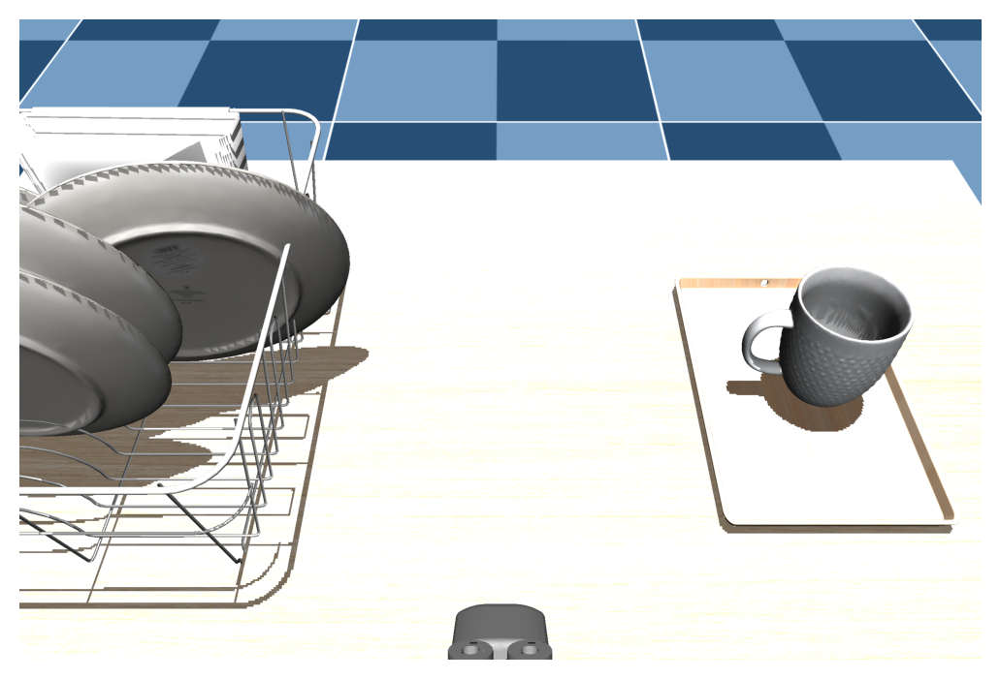

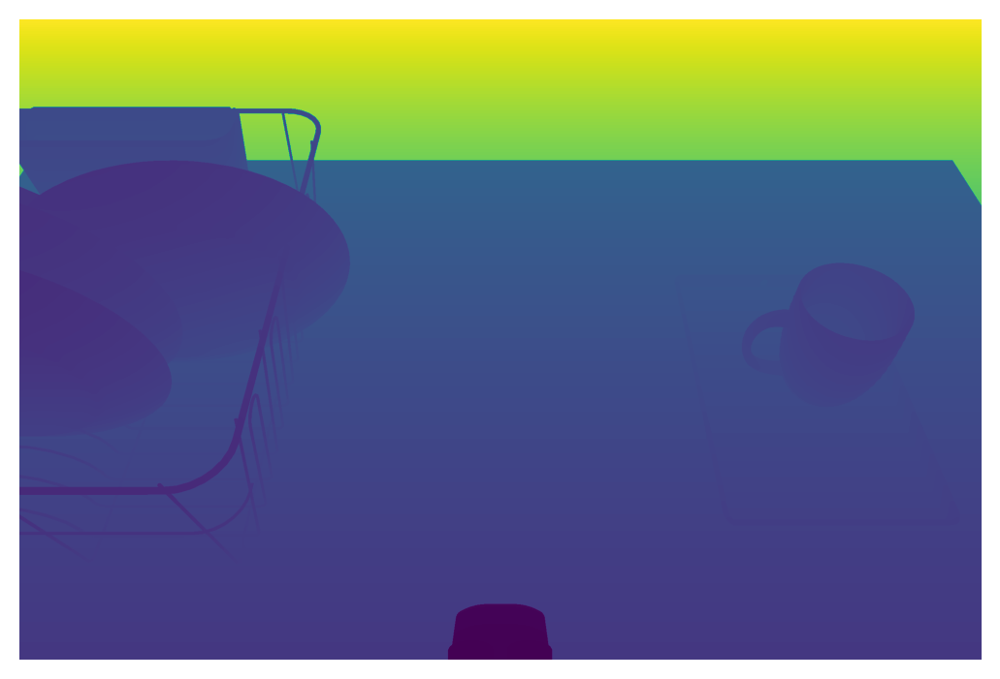

2. Result: (0.8838268504674297, 0.33531710181911406)
[ 0.5  -0.01  1.16]


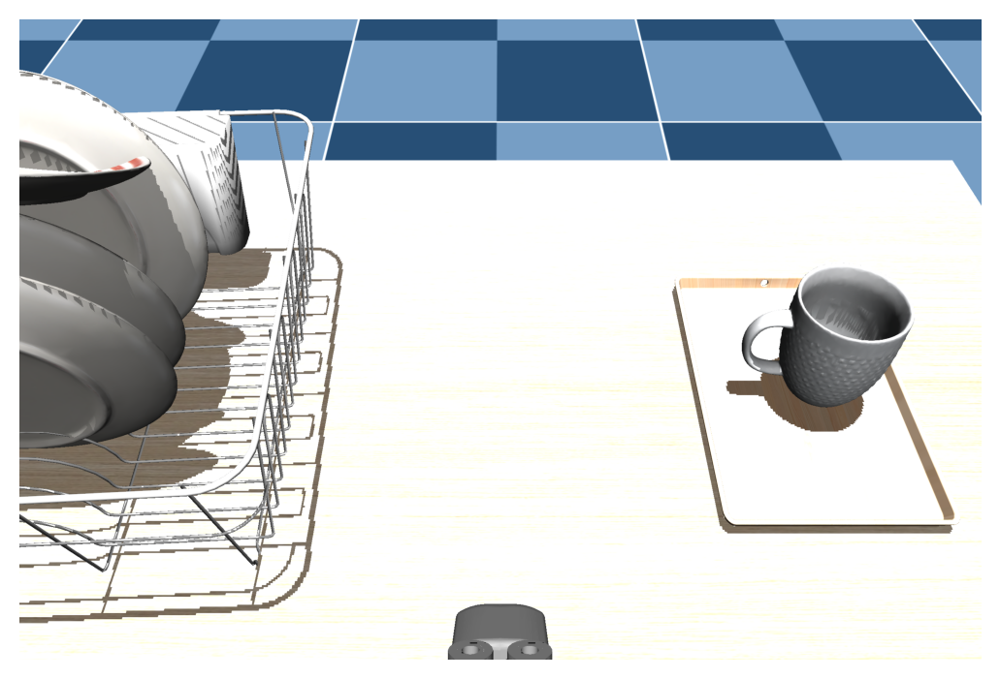

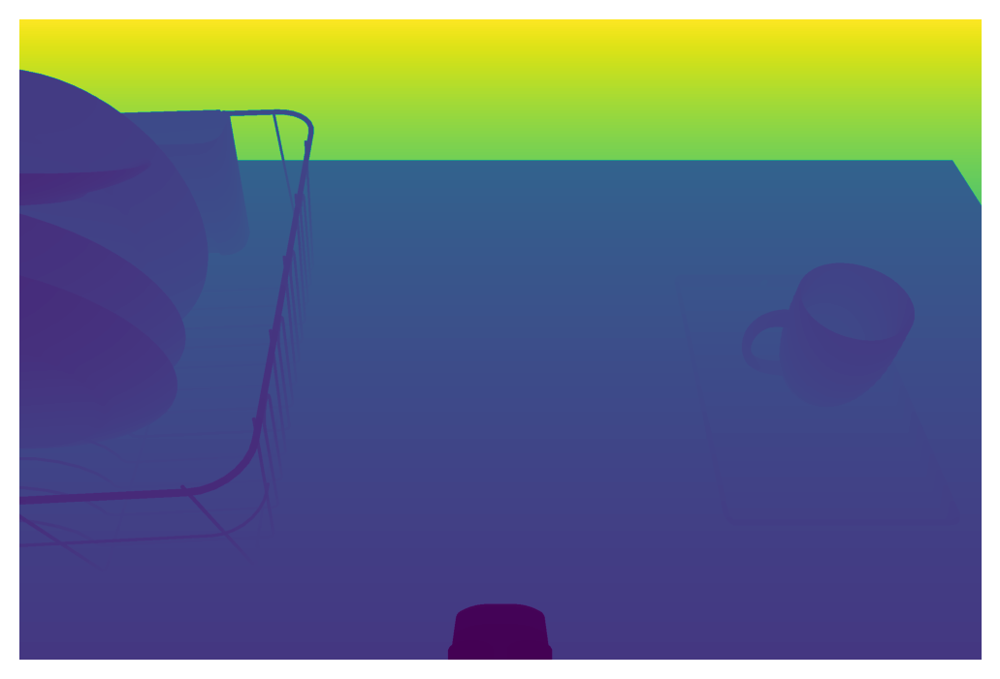

3. Result: (0.8279356867198042, 0.2958760690480643)
[ 0.5  -0.01  1.16]


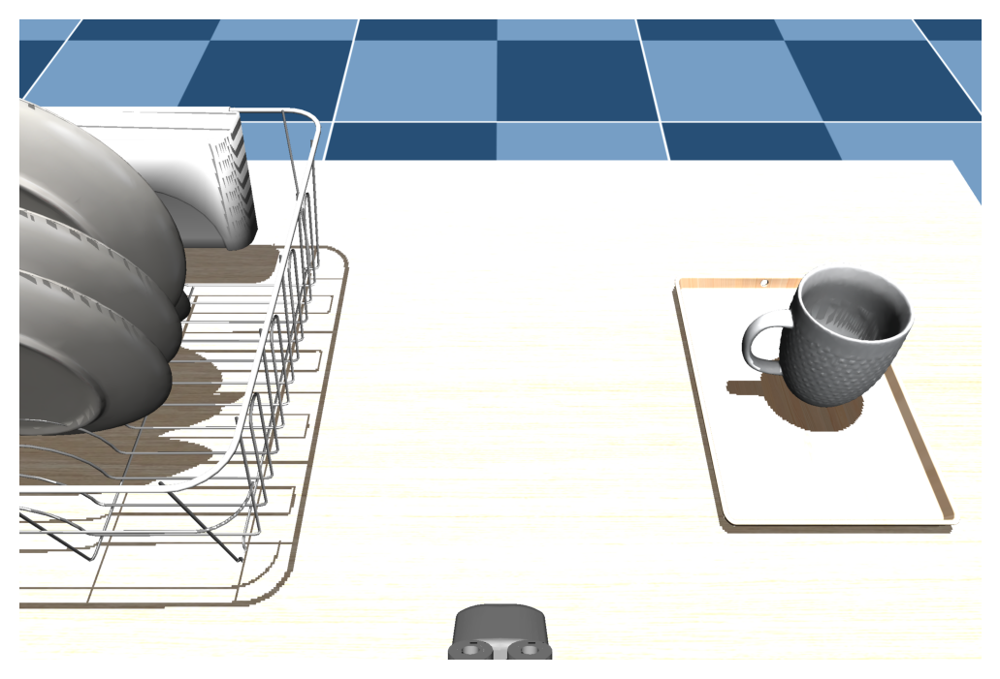

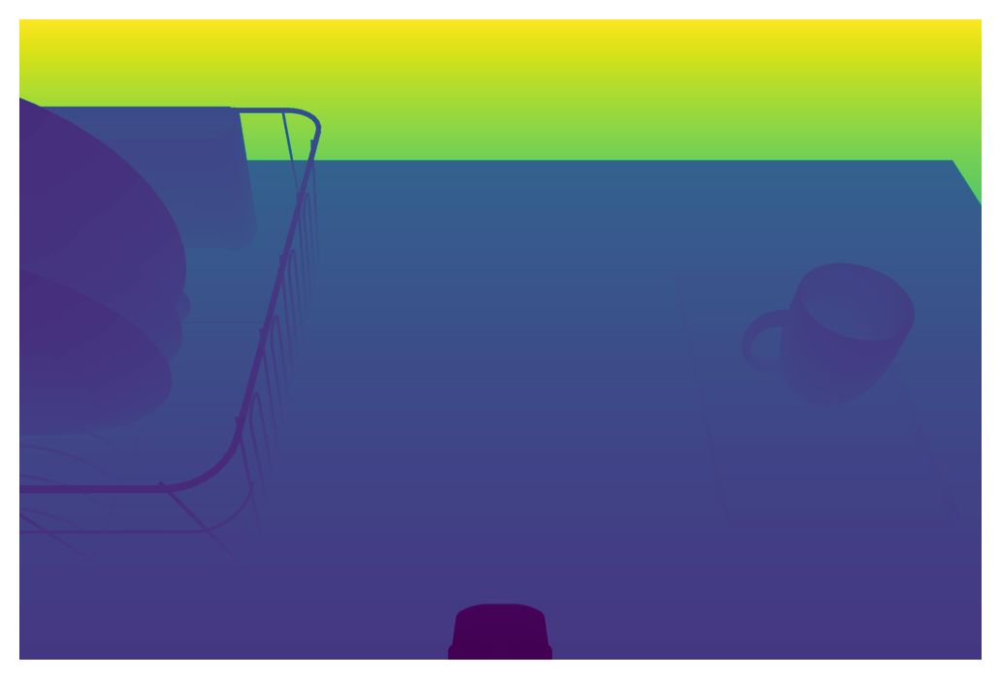

4. Result: (0.8916131793904075, 0.37078804942583354)
[ 0.5  -0.01  1.16]


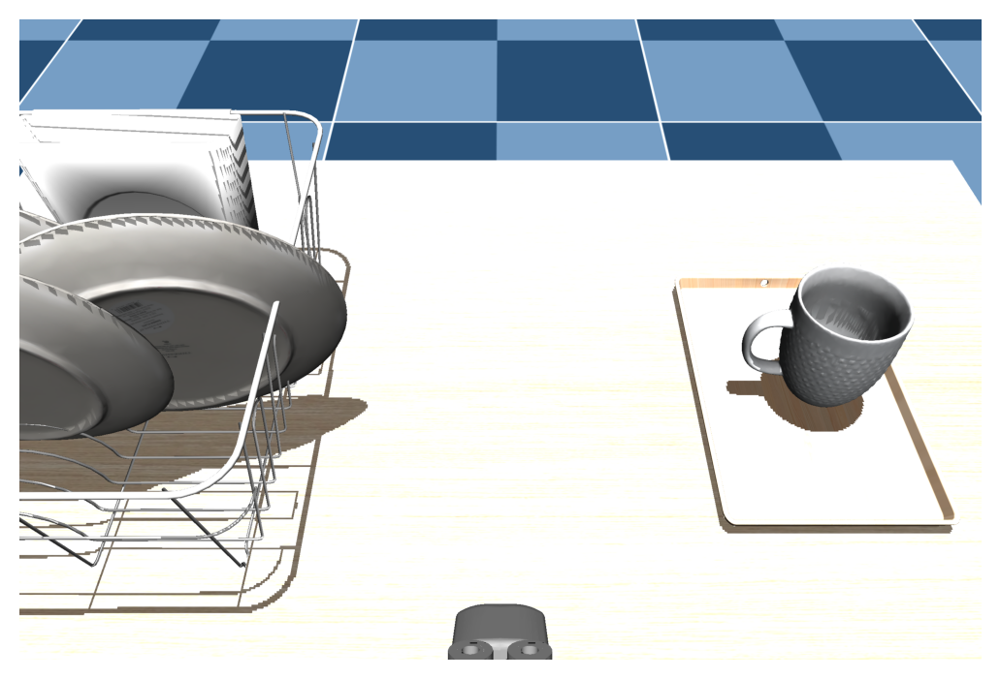

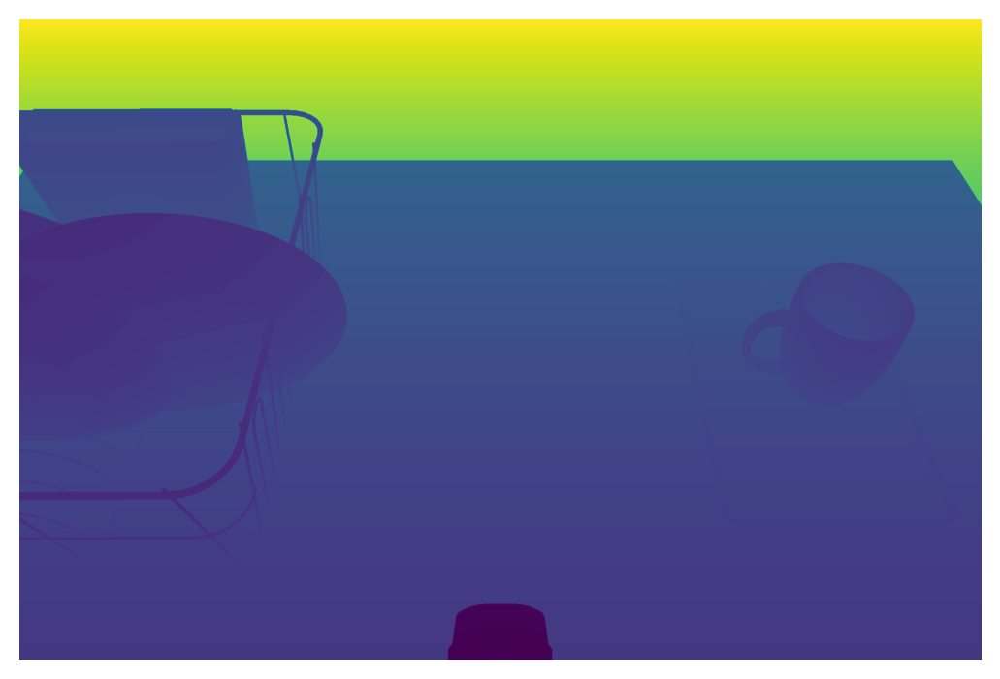

5. Result: (0.9796746636221649, 0.3490766593418144)
[ 0.5  -0.01  1.16]


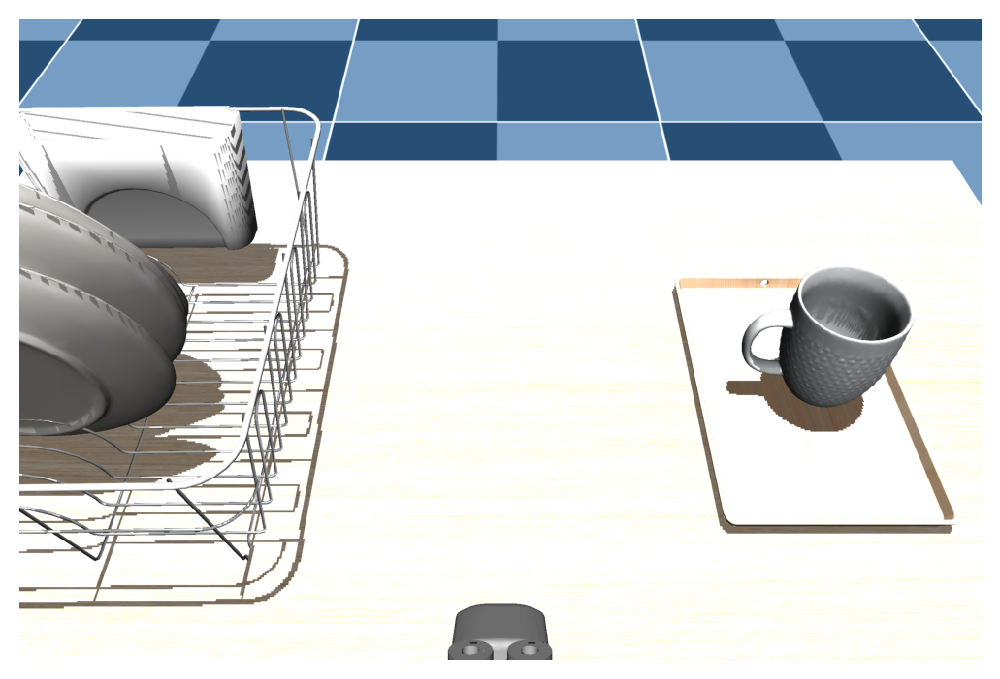

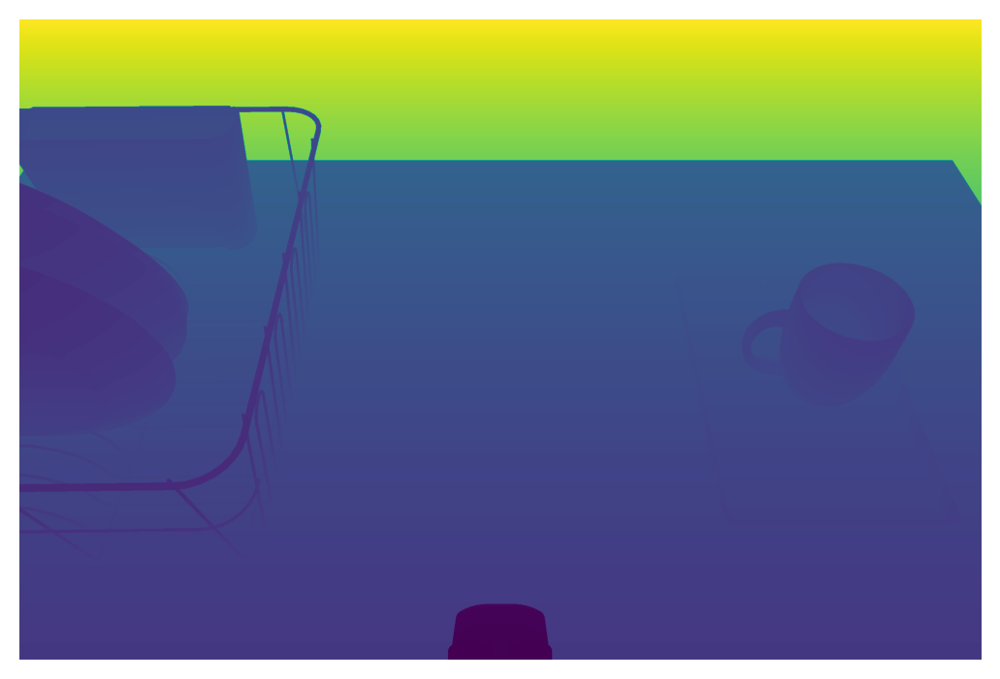

6. Result: (0.9330682139599902, 0.35839846842736156)
[ 0.5  -0.01  1.16]


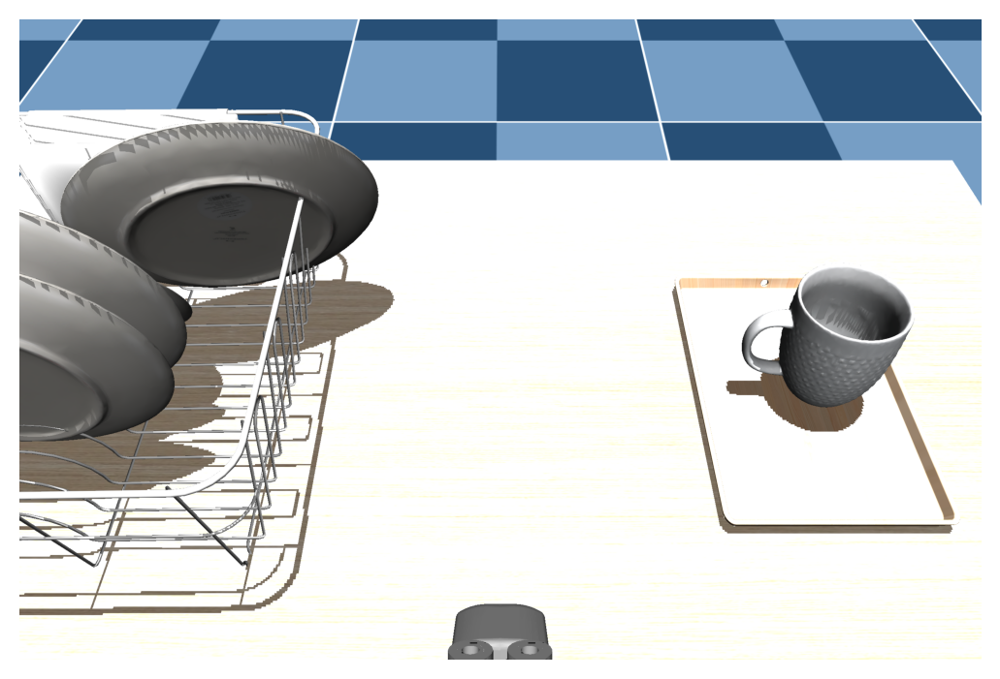

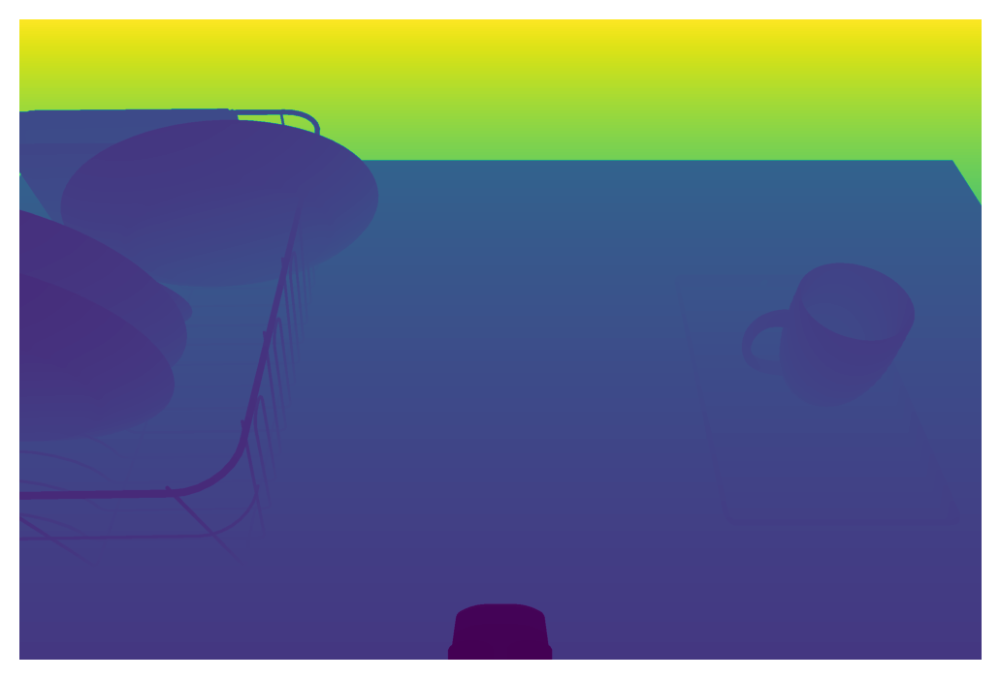

7. Result: (0.9742370556726803, 0.3946677599369103)
[ 0.5  -0.01  1.16]


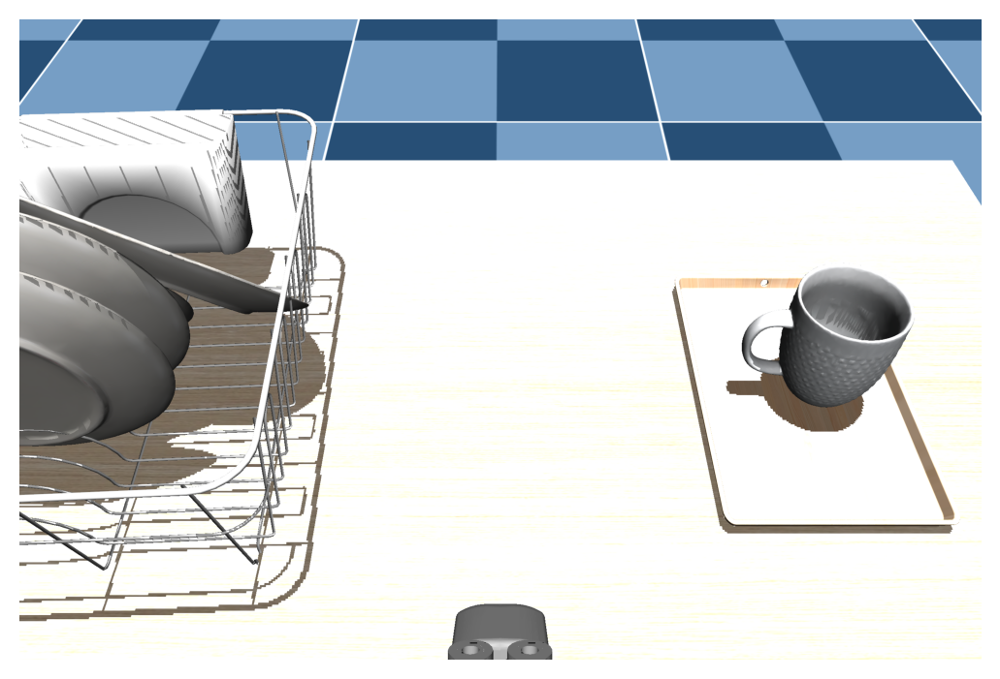

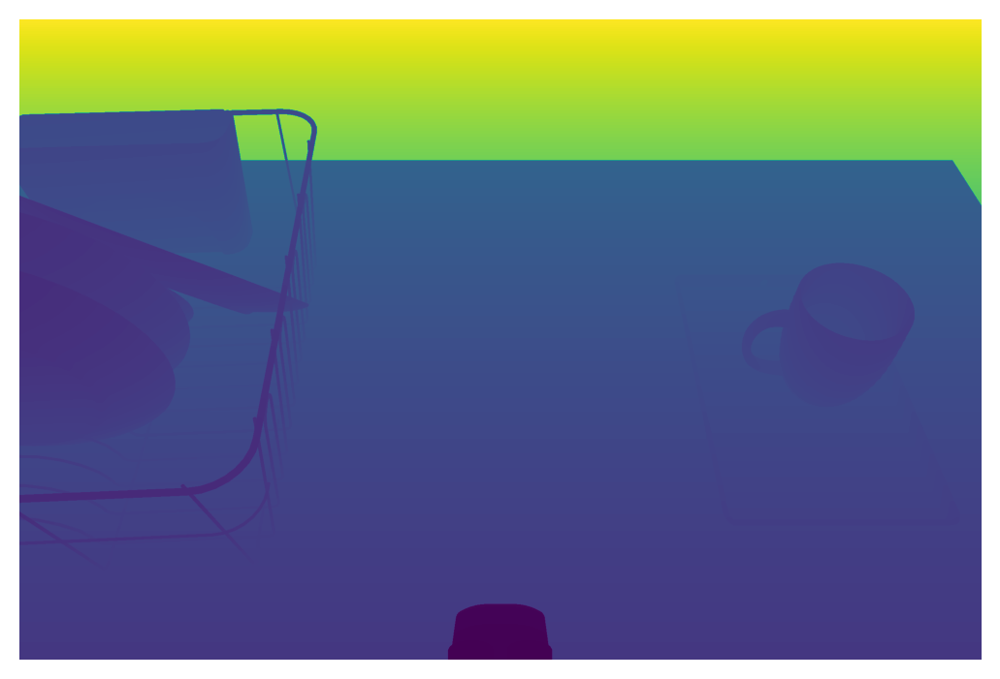

8. Result: (0.9336846657703771, 0.2994527848277344)
[ 0.5  -0.01  1.16]


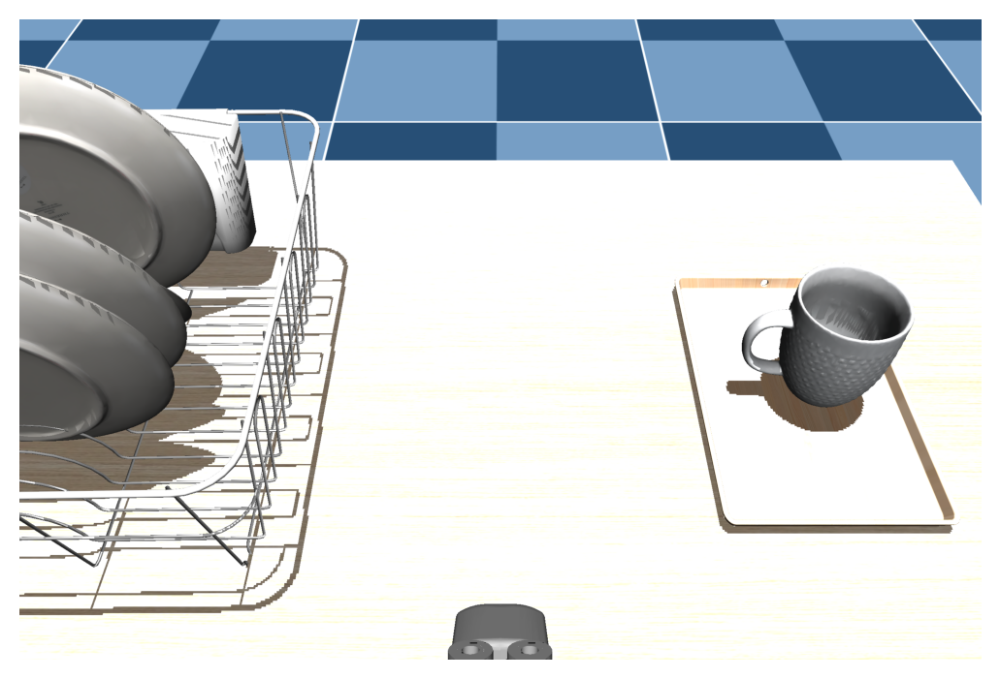

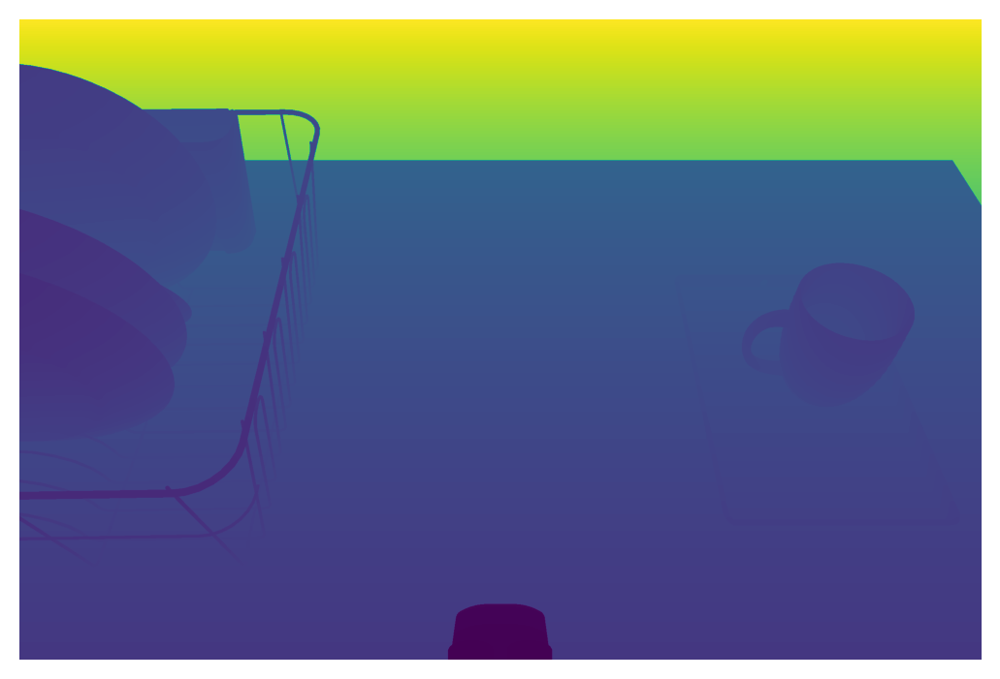

9. Result: (0.9651692657172297, 0.3690523563977876)
[ 0.5  -0.01  1.16]


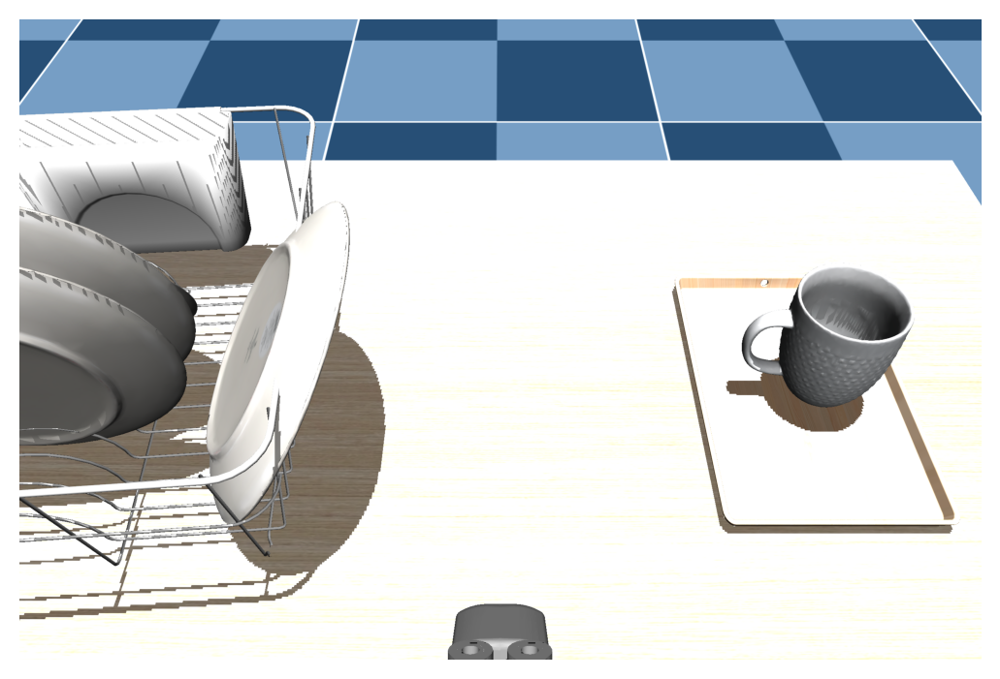

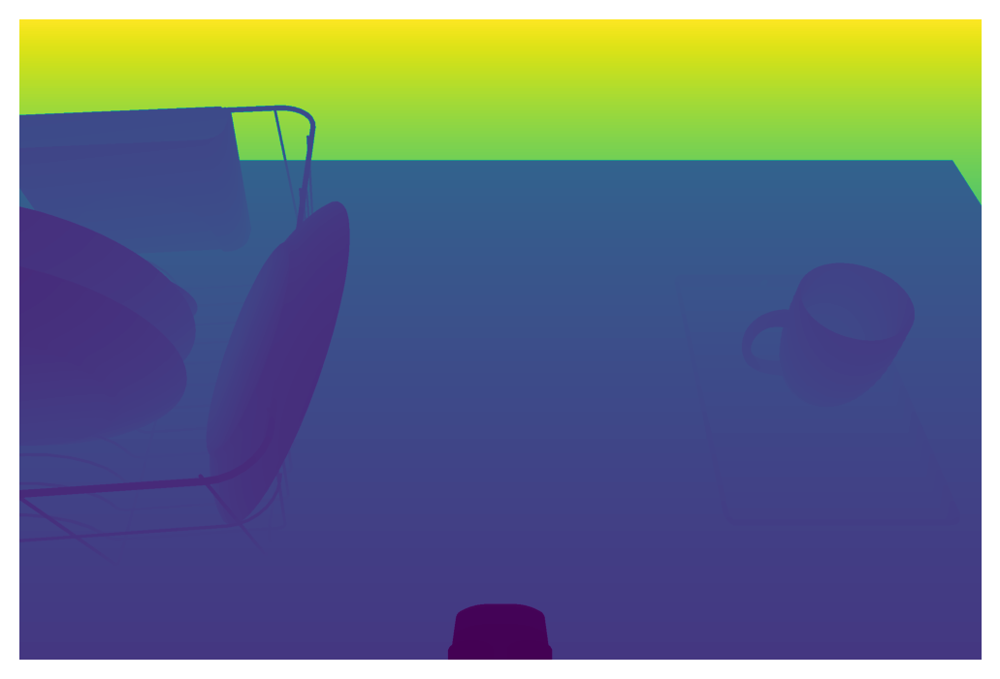

10. Result: (0.981347077485711, 0.3485046703659393)
[ 0.5  -0.01  1.16]


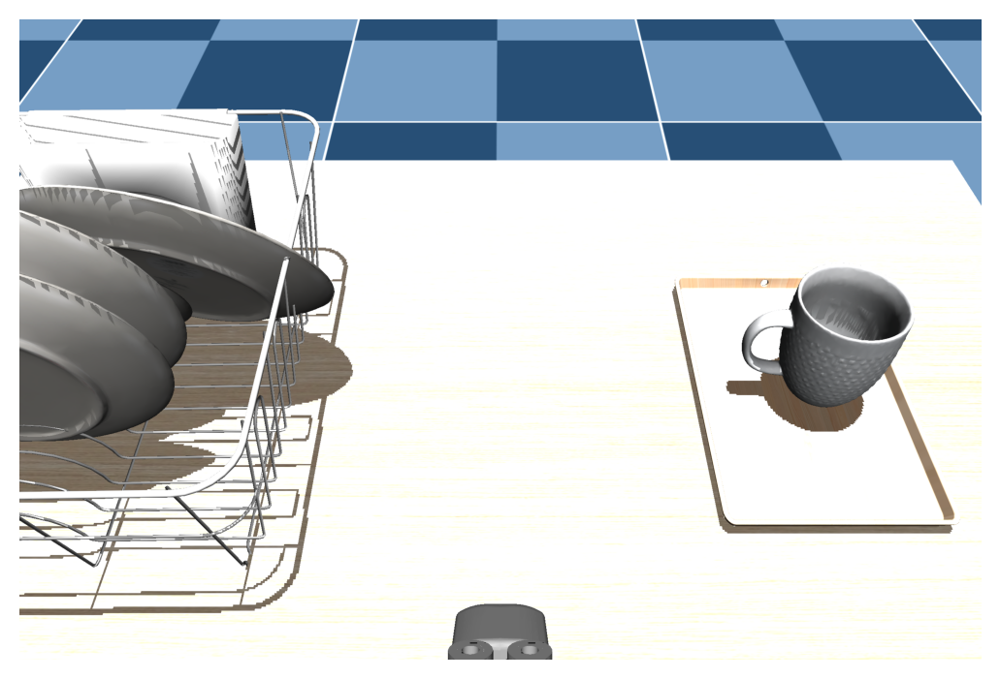

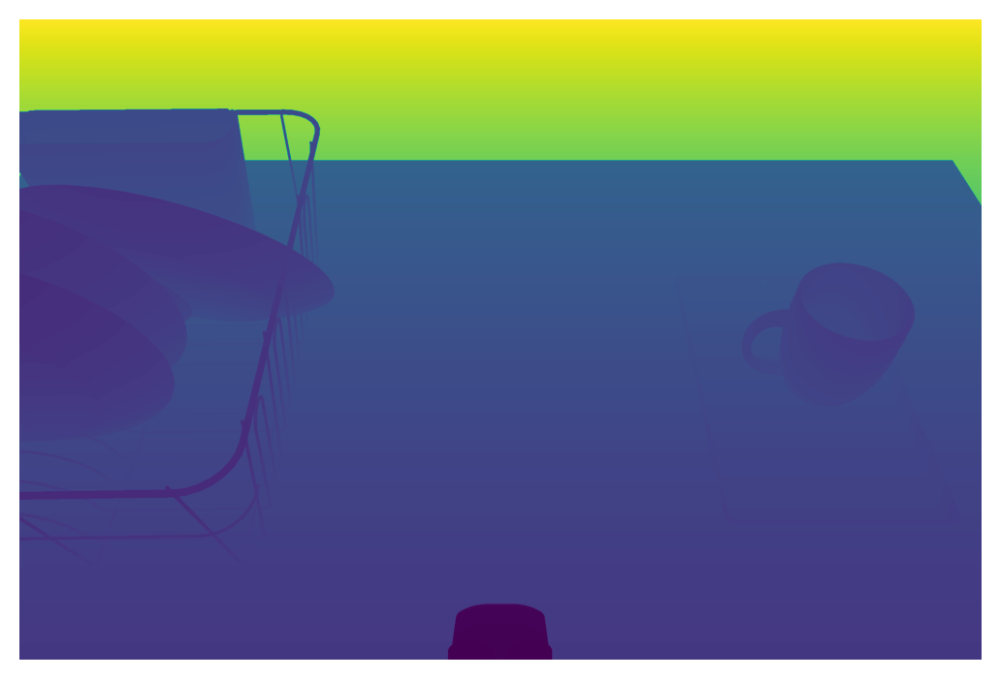

11. Result: (1.0176550462241924, 0.3320561829839088)
[ 0.5  -0.01  1.16]


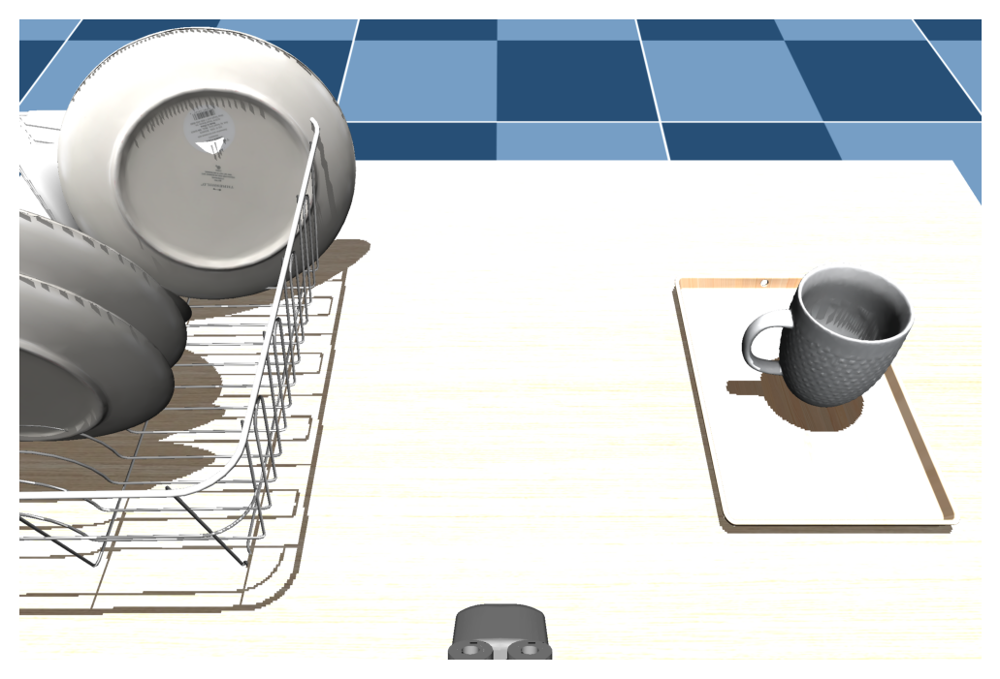

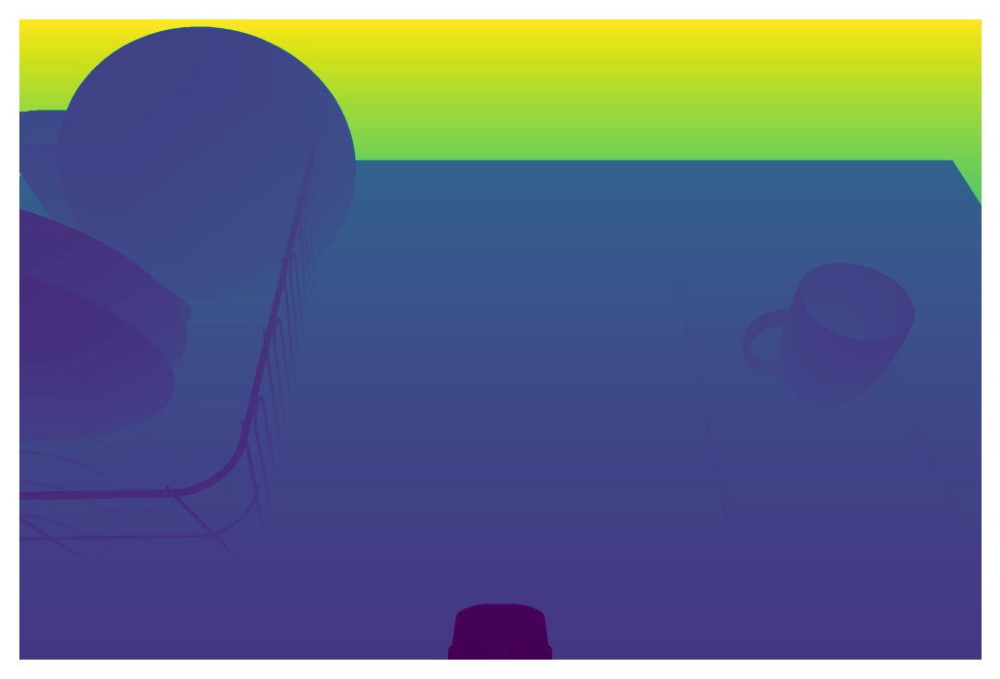

12. Result: (0.9996530207131522, 0.35575594863036164)
[ 0.5  -0.01  1.16]


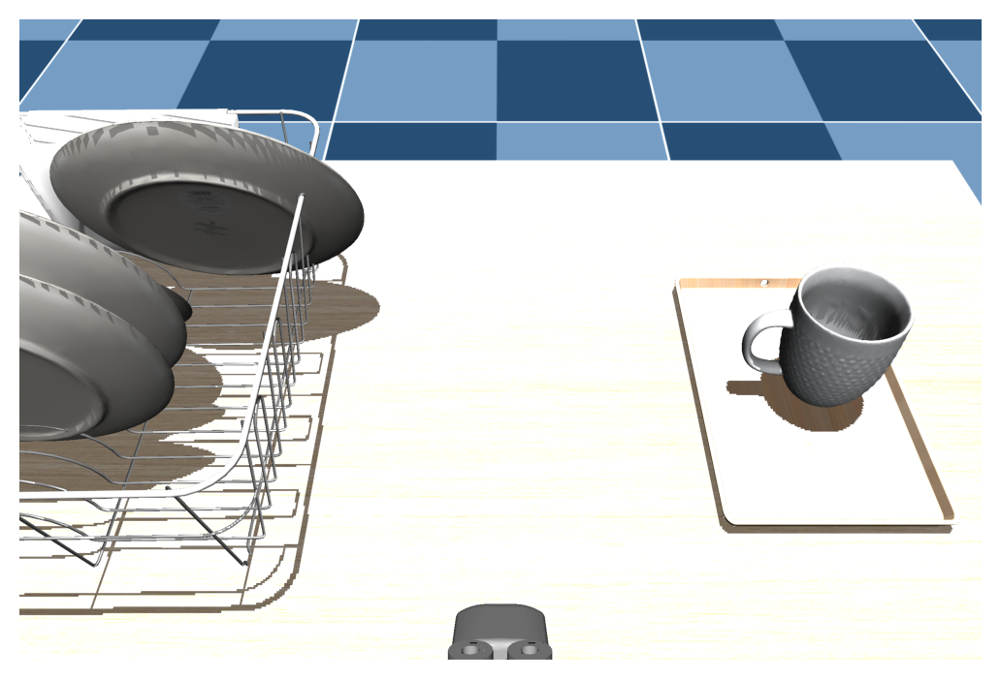

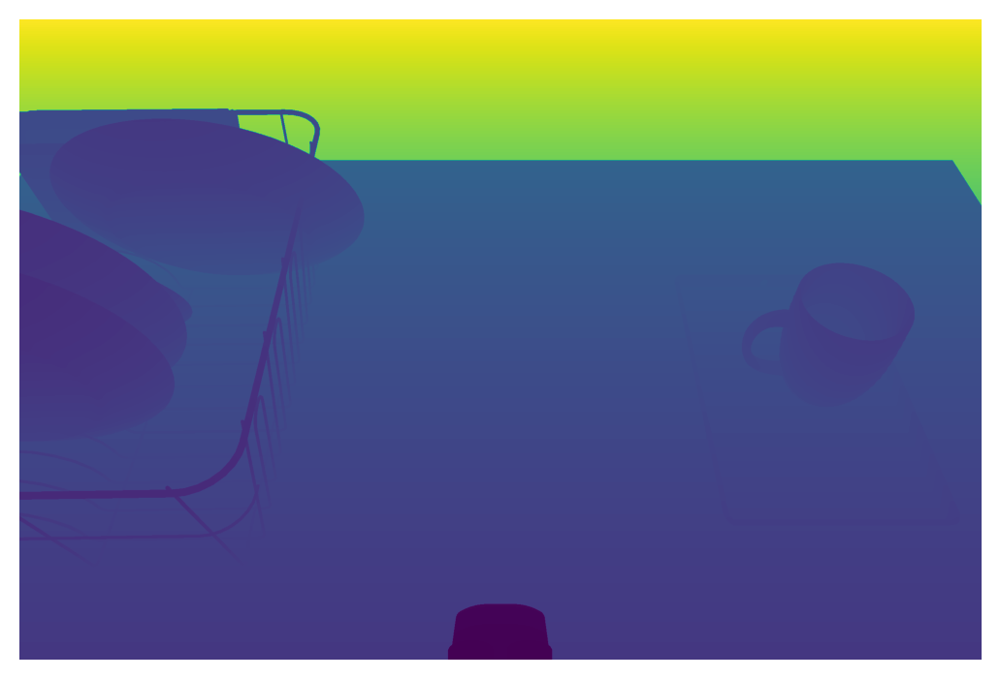

13. Result: (0.8941865495377249, 0.2935776063603802)
[ 0.5  -0.01  1.16]


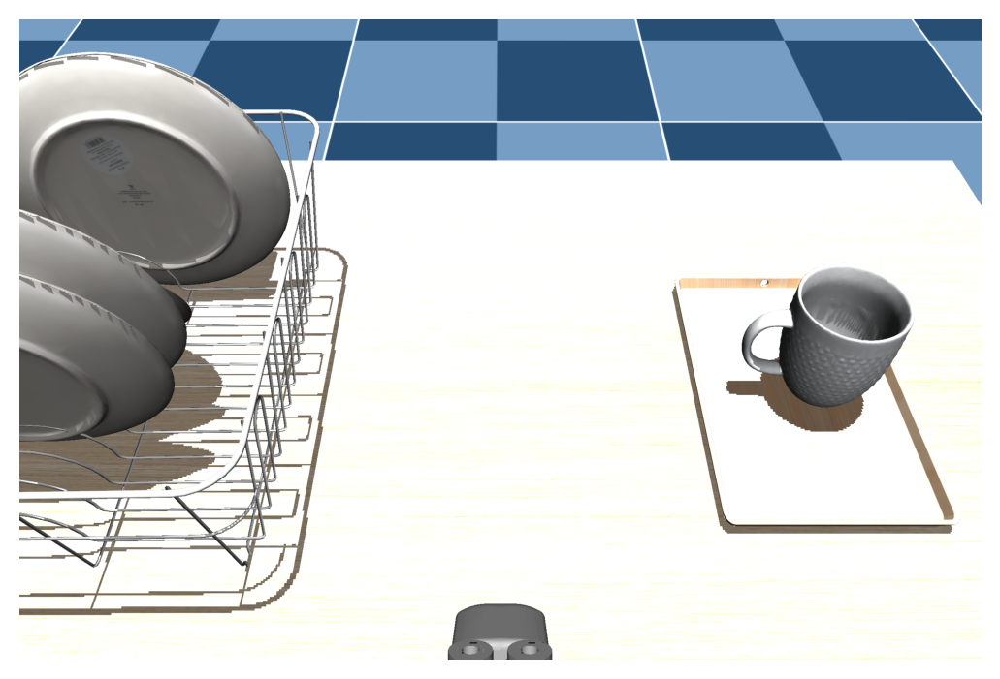

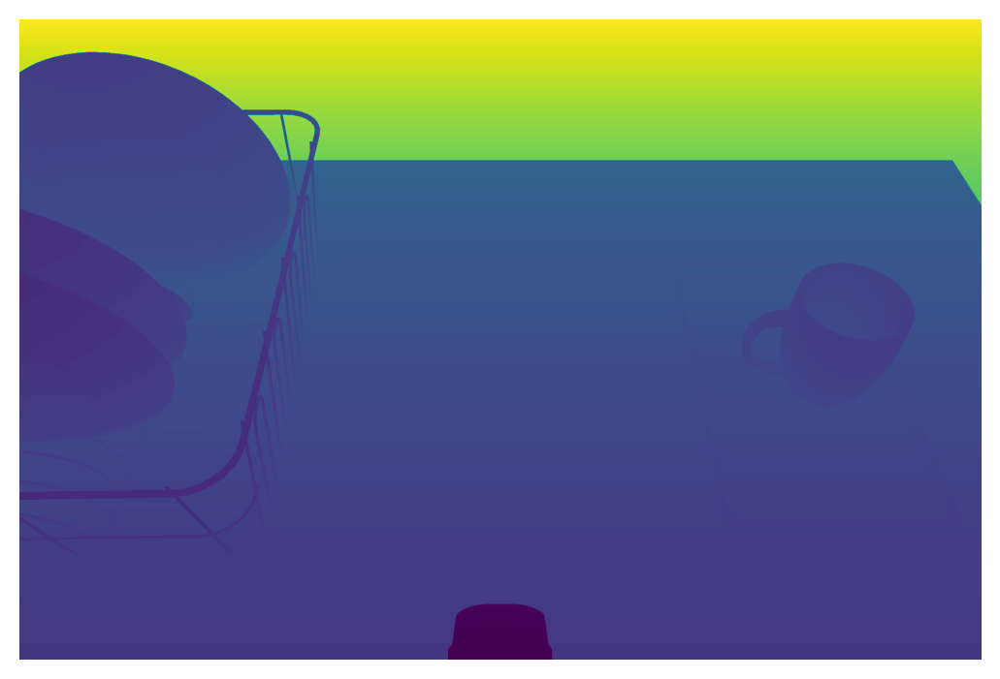

14. Result: (0.9124484724230583, 0.42116605130835916)
[ 0.5  -0.01  1.16]


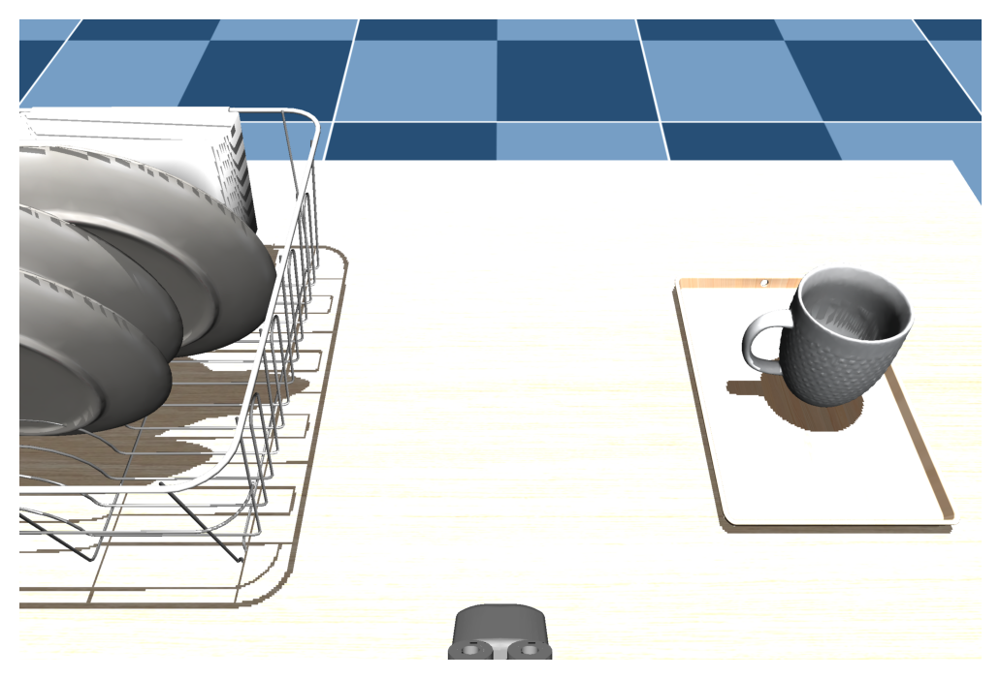

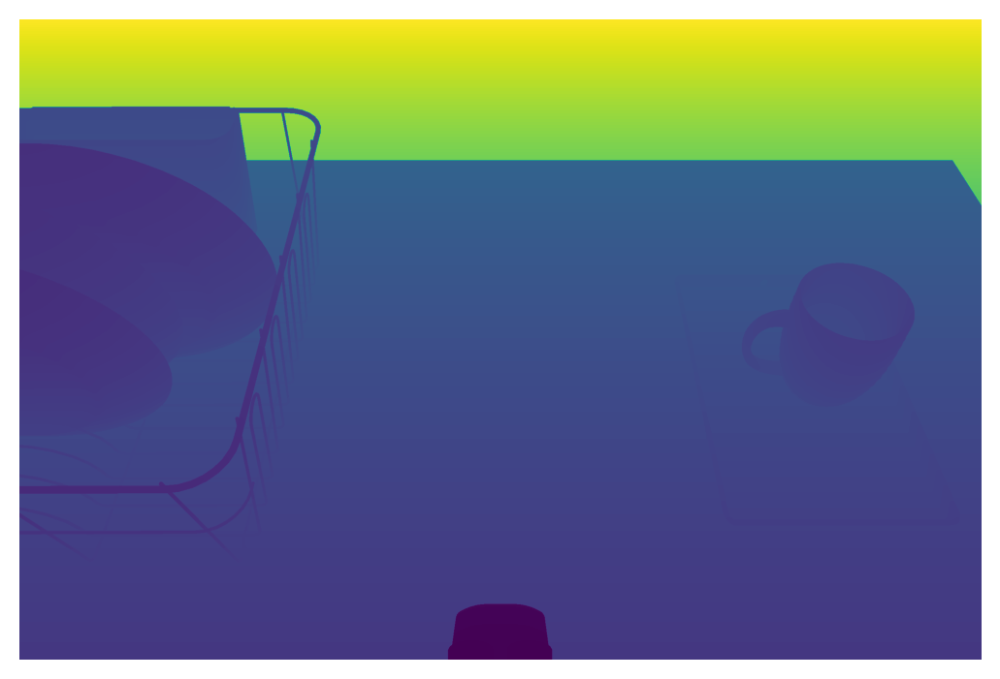

15. Result: (0.9608187248307365, 0.38444419321330014)
[ 0.5  -0.01  1.16]


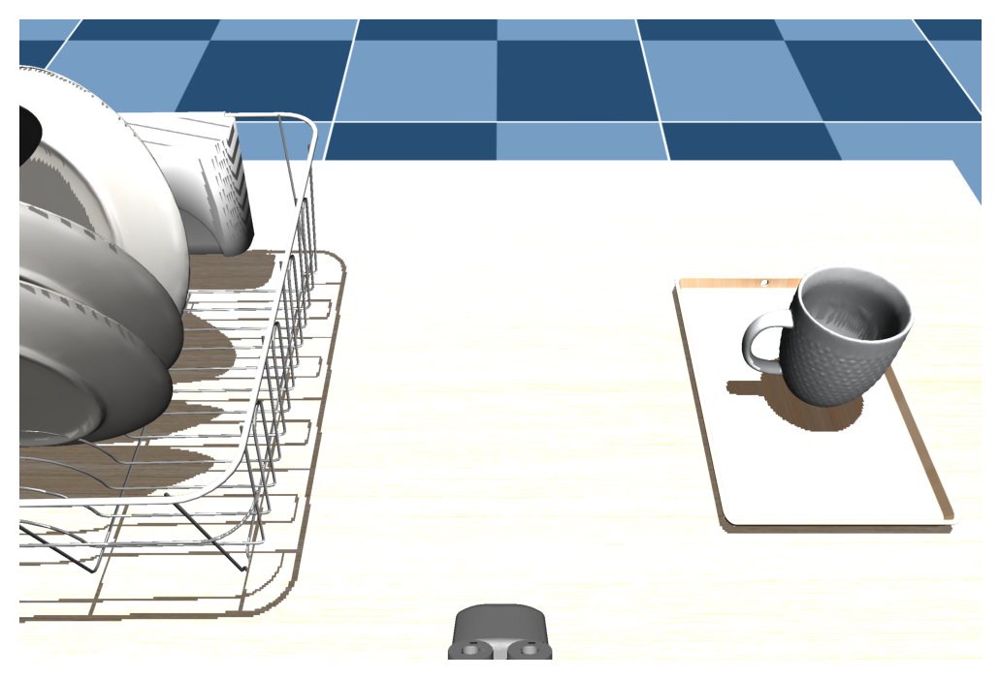

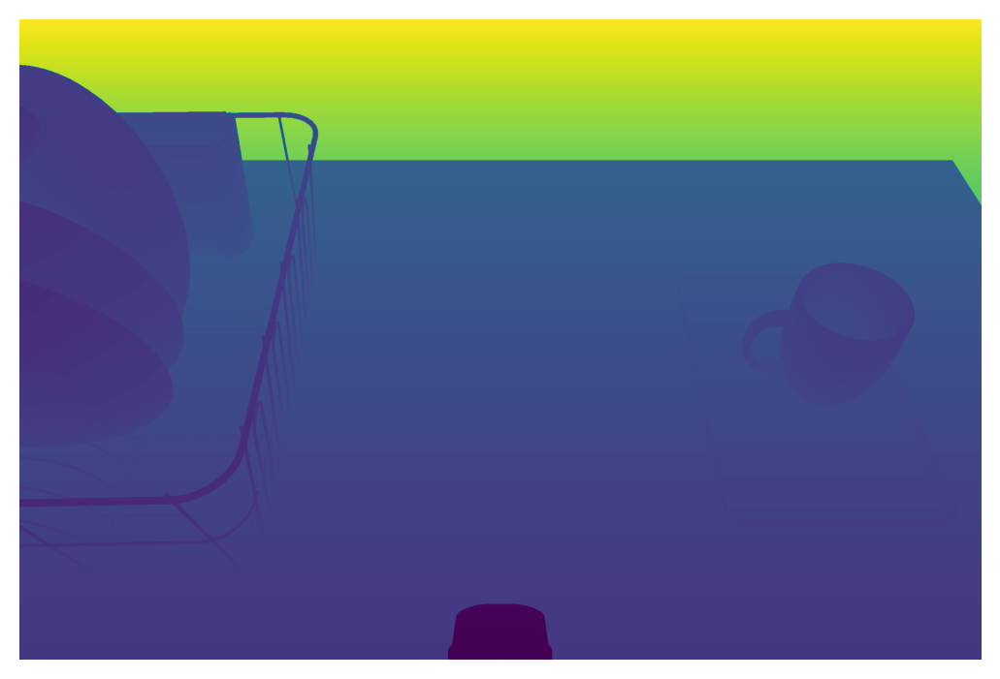

16. Result: (0.8012063713454401, 0.38554821022850194)
[ 0.5  -0.01  1.16]


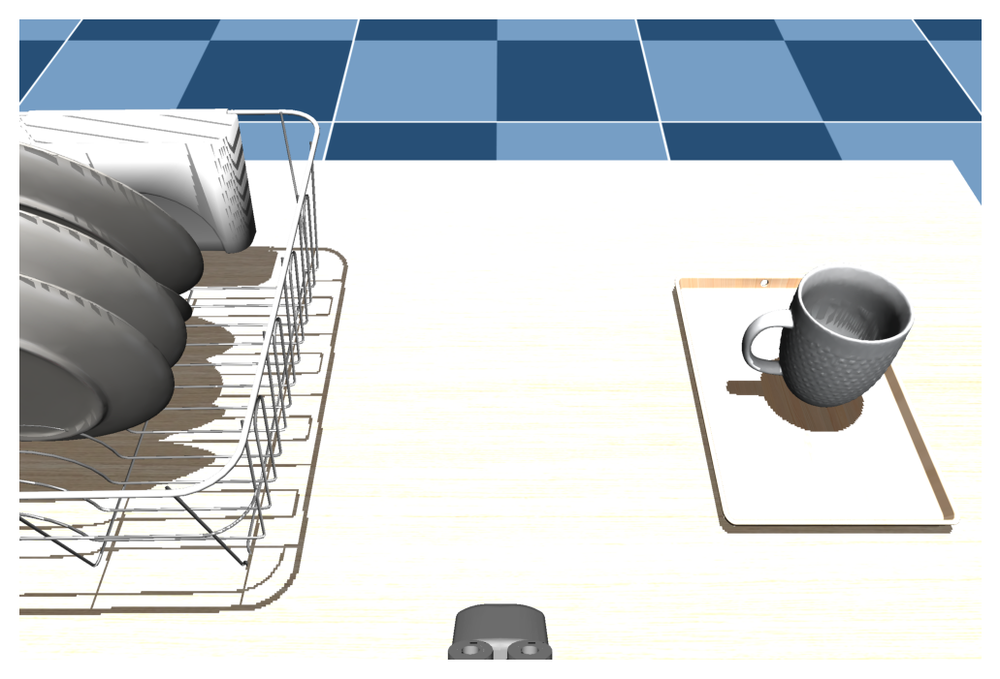

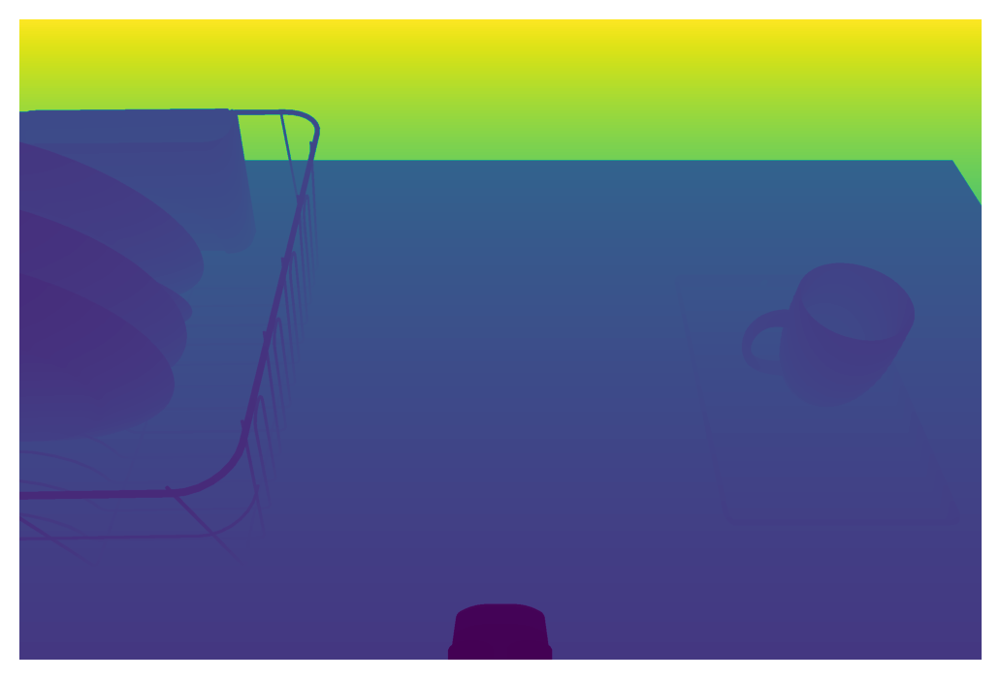

17. Result: (0.9477926205459921, 0.32250368577973365)
[ 0.5  -0.01  1.16]


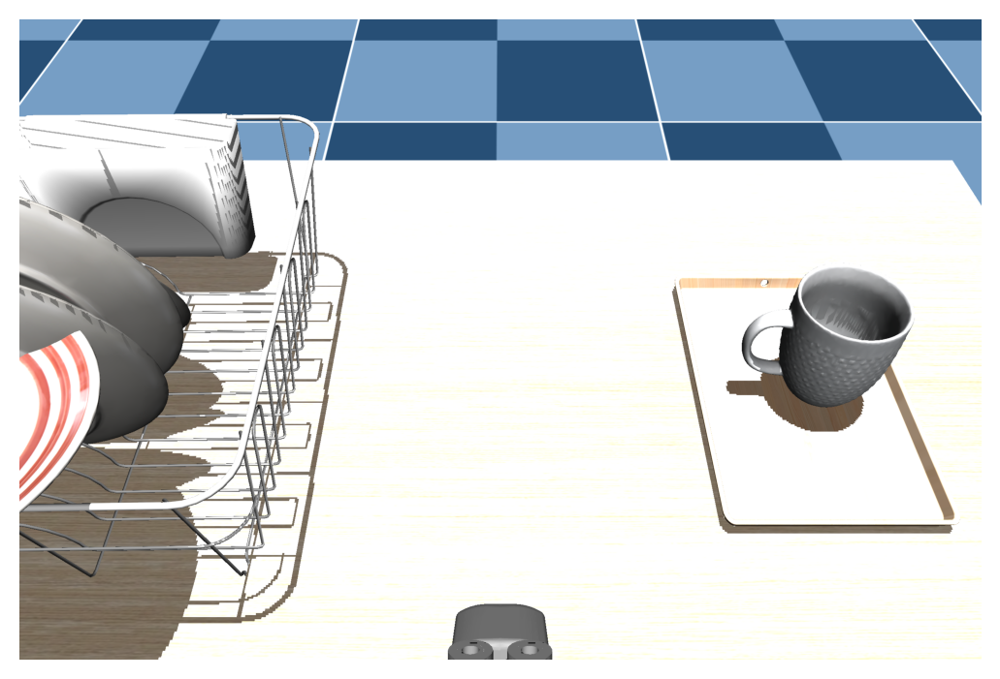

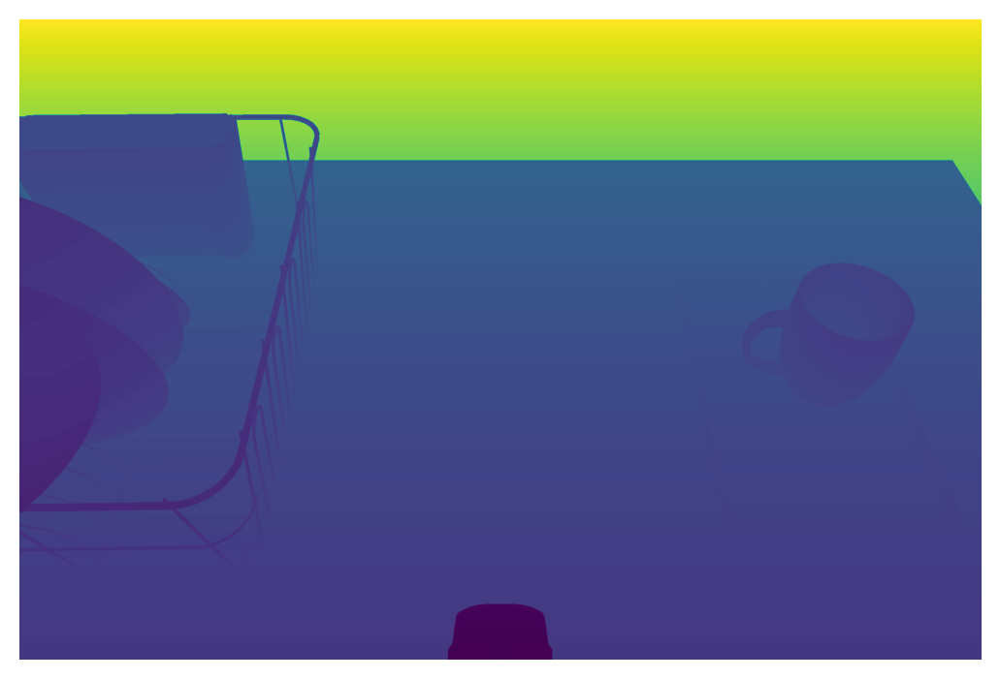

18. Result: (0.8886307816909802, 0.34988447740932094)
[ 0.5  -0.01  1.16]


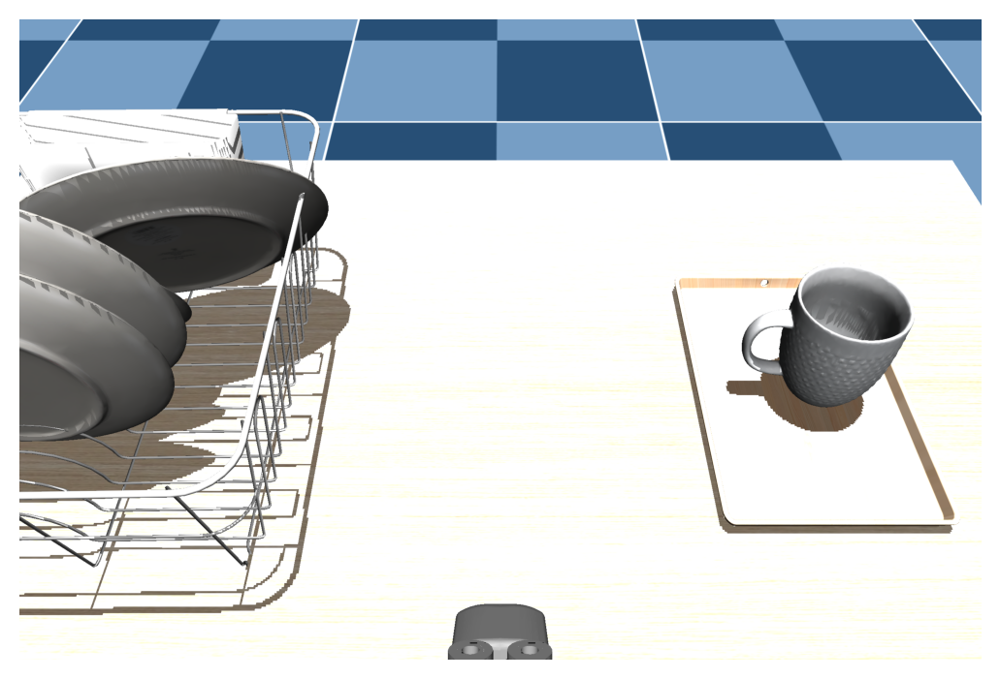

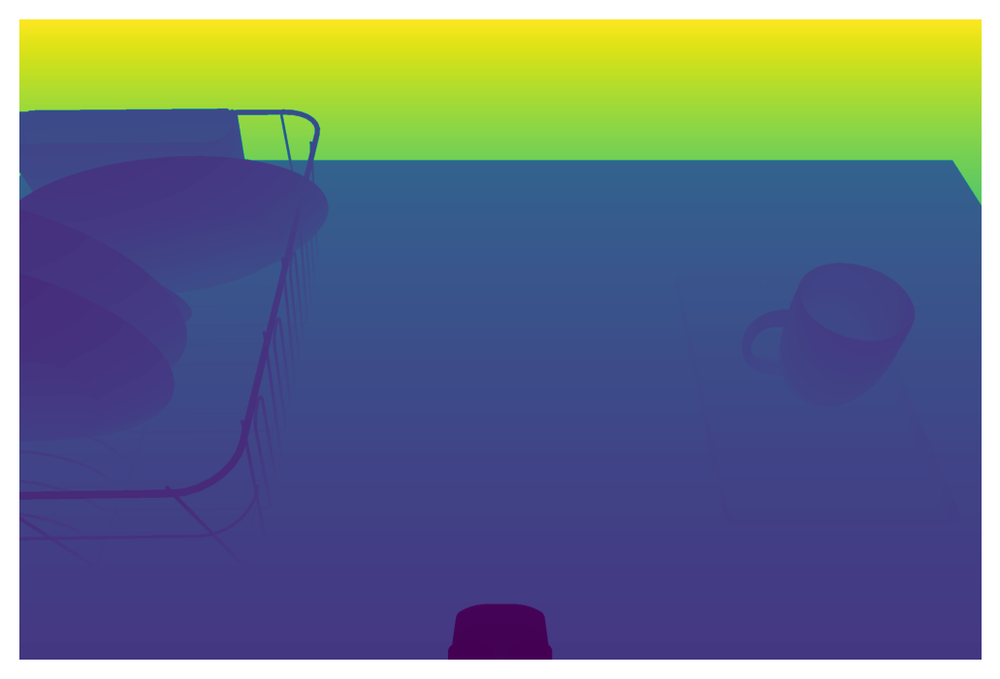

19. Result: (1.0062438131574367, 0.29724496502888376)
[ 0.5  -0.01  1.16]


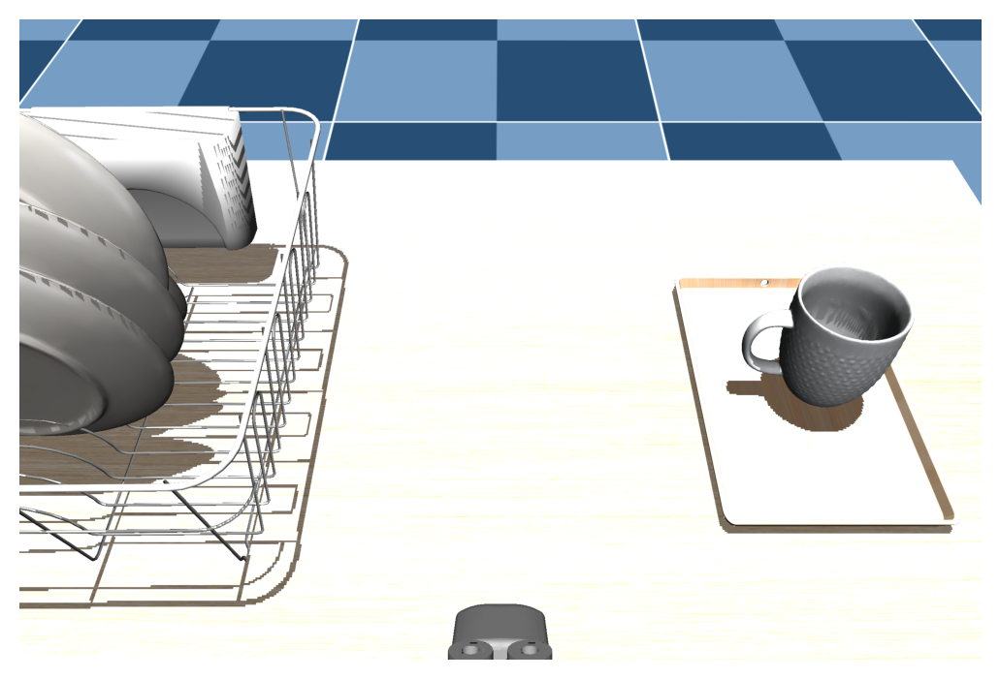

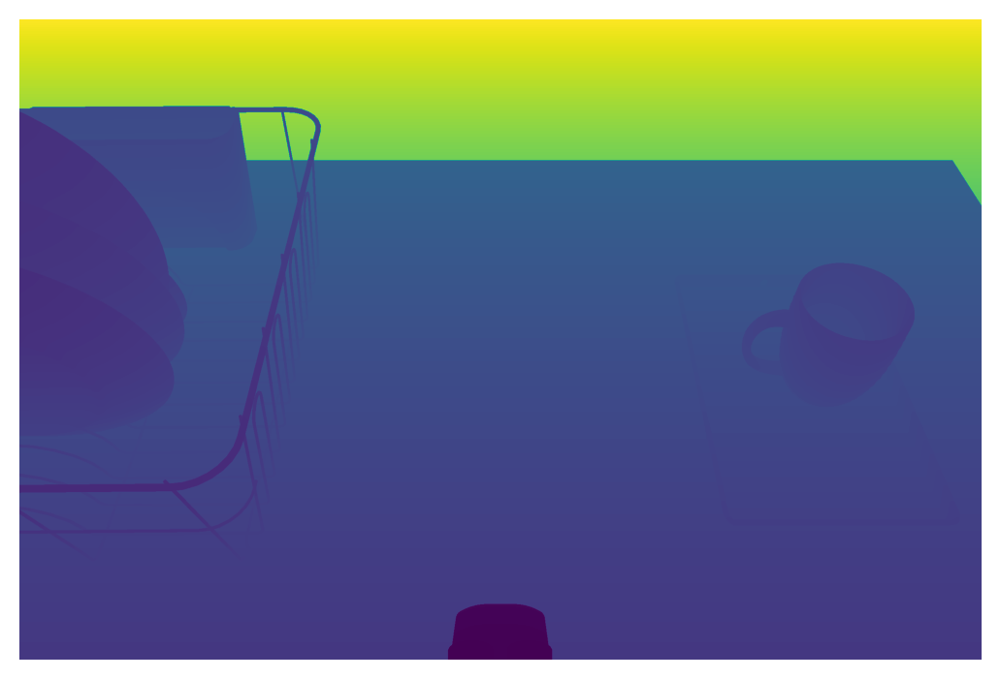

20. Result: (0.8986097482631858, 0.4180892375175292)
[ 0.5  -0.01  1.16]


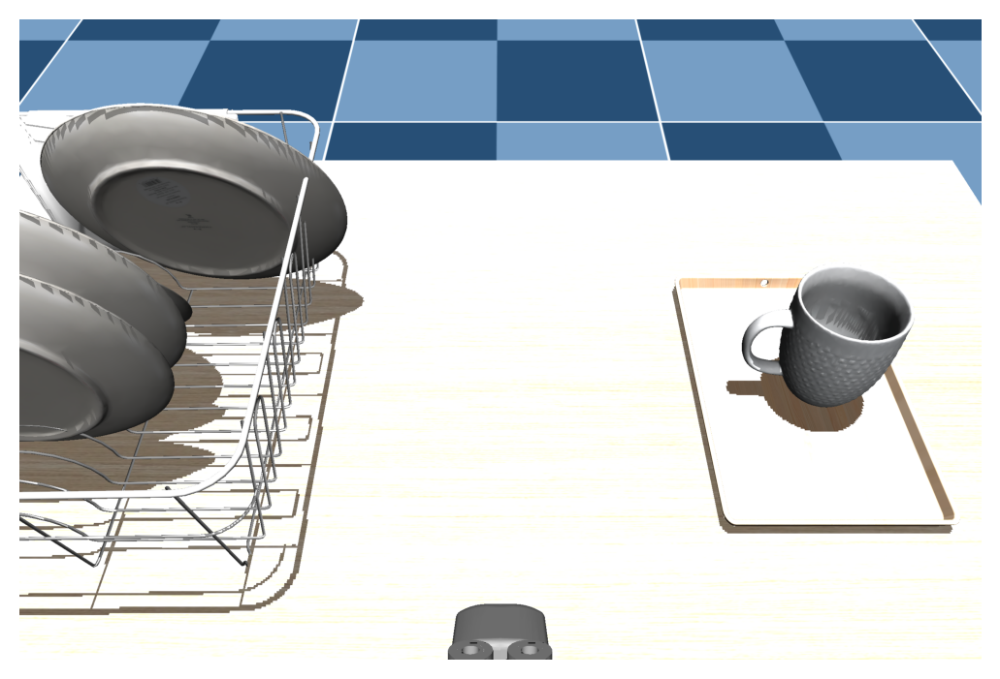

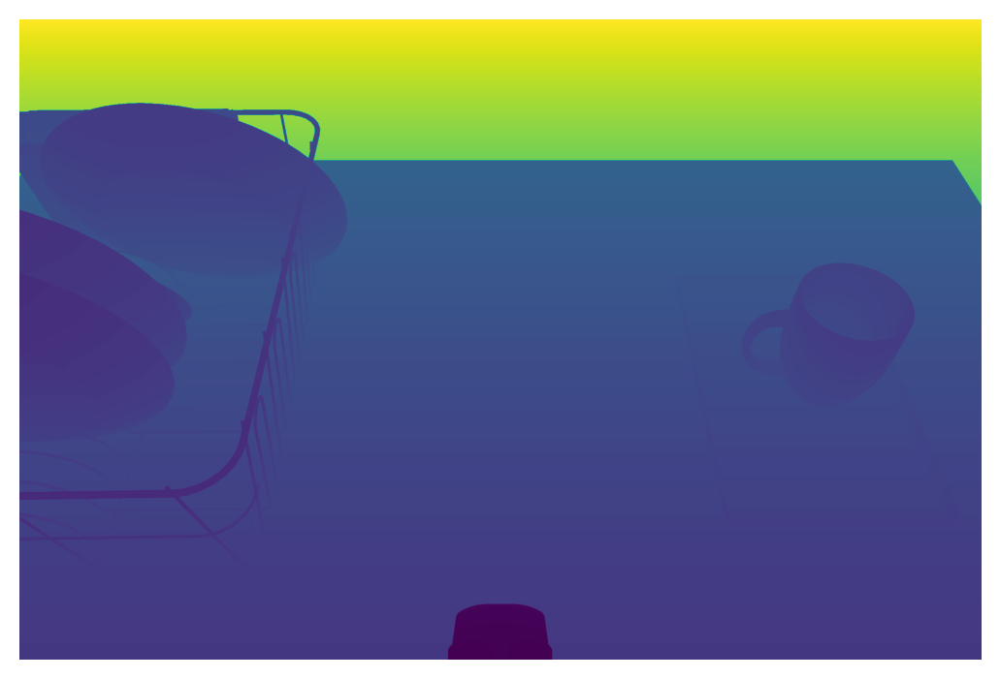

Done. Tick:[1001] Time:[2.00]sec


: 

In [15]:
for i in range(20):
    res = gauss_2d([0.92, 0.35],0.05)
    print("{}. Result: {}".format(i+1,res))
    # Init viewer
    env.init_viewer(viewer_title='UR5e with RG2 gripper',viewer_width=1200,viewer_height=800,
                    viewer_hide_menus=True, MODE='window')
    env.update_viewer(azimuth=30,distance=3.0,elevation=-30,lookat=[1.0,0.0,0.71],
                    VIS_TRANSPARENT=False,VIS_CONTACTPOINT=False,
                    contactwidth=0.05,contactheight=0.05,contactrgba=np.array([1,0,0,1]),
                    VIS_JOINT=False,jointlength=0.25,jointwidth=0.05,jointrgba=[0.2,0.6,0.8,0.6])

    pcd_tick = 0

    # Reset
    env.reset()
    init_ur_q = np.array([np.deg2rad(-90), np.deg2rad(-130), np.deg2rad(120), np.deg2rad(100), np.deg2rad(45), np.deg2rad(-90)])
    env.forward(q=init_ur_q, joint_idxs=env.idxs_forward)
    initial_xyz = env.get_p_body('tcp_link')
    print(env.get_p_body('tcp_link'))
    tick,max_sec = 0,2


    # Target dish
    env.model.joint(env.model.body('kitchen-plate').jntadr[0]).qpos0[:3] = np.array([res[0], res[1], 0.82+0.25])
    env.model.joint(env.model.body('kitchen-plate').jntadr[0]).qpos0[3:] = r2quat(rpy2r(np.radians([0, 90, 360])))
    while env.get_sim_time() <= max_sec:
        env.step(ctrl=init_ur_q,ctrl_idxs=env.idxs_step)
        if not env.is_viewer_alive(): break
        # Render
        if env.loop_every(HZ=20):
            # Compute some poses
            p_tcp,R_tcp = env.get_pR_body(body_name='tcp_link')
            p_cam,R_cam = env.get_pR_body(body_name='camera_center')
            p_base,R_base = env.get_pR_body(body_name='base')
            # Get PCD from a specific view
            p_ego  = p_cam
            p_trgt = p_cam + R_cam[:,2] + np.array([0,0,-0.1])
            rgb_img,depth_img,pcd,xyz_img = env.get_egocentric_rgb_depth_pcd(
                p_ego=p_ego,p_trgt=p_trgt,rsz_rate=40,fovy=45,BACKUP_AND_RESTORE_VIEW=True)
            env.render(render_every=1)
    plt.imshow(rgb_img); plt.axis('off'); plt.show()
    plt.imshow(depth_img); plt.axis('off'); plt.show()
    p_dish2, R_dish2 = env.get_pR_body(body_name='kitchen-plate-2')

    # Close viewer
    env.close_viewer()
print ("Done. Tick:[%d] Time:[%.2f]sec"%(env.tick,env.get_sim_time()))

In [4]:
import openai 
import os 
openai.api_key = 'your key' 

class ChatGPT():
    def __init__ (self, model_engine='text-davinci-003'):
        self.model_engine = model_engine
        self.msg_history_turbo = []
        self.msg_history_davinci = ""
        self.role = 'user'
        
    def get_answer(self, prompt=None):
        if self.model_engine == 'gpt-3.5-turbo':
            self.msg_history_turbo.append({"role": self.role, "content":prompt})
            response   = openai.ChatCompletion.create(
            model      = self.model_engine,
            messages   = self.msg_history_turbo)
            reply_text = response['choices'][0]['message']['content']
            self.msg_history_turbo.append({"role":"assistant", "content":reply_text})

        elif self.model_engine == 'text-davinci-003': 
            self.msg_history_davinci += "You: "+prompt 
            response   = openai.Completion.create(
            engine     = self.model_engine,
            prompt     = self.msg_history_davinci,
            max_tokens = 512,
            temperature= 1.0,
            n          = 1,
            #stop       = ["You:", "AI:"]
            )
            reply_text = response.choices[0].text.strip().replace('Answer: ', '')
            self.msg_history_davinci+="\n"+"AI: "+reply_text+"\n"
        # print("ChatGPT: {}".format(reply_text))
        return reply_text
